In [1]:
import pandas as pd
from matplotlib import pyplot as plt
from pathlib import Path
import numpy as np
import sqlite3

from md_output_parser import MDVideoOutputParser
from matplotlib.colors import ListedColormap


In [2]:
# Create figure with two subplots sharing y axis
blues = plt.get_cmap('Blues_r')(np.linspace(0.3, 0.7, 3))
purples = plt.get_cmap('Purples_r')(np.linspace(0.3, 0.7, 3))
# Create a dictionary to map (year, cam_id) to colors
color_dict = {
    (2024, 'C1'): purples[0],
    (2024, 'C2'): purples[1],
    (2024, 'C3'): purples[2],
    (2023, 'C1'): blues[0],
    (2023, 'C2'): blues[1],
    (2023, 'C3'): blues[2]
}

mpl_config = {
    "figure.figsize": (12, 8),
    "figure.dpi": 600,
    "figure.facecolor": "white",
    "svg.fonttype": "none",

    # Font settings
    "font.family": "sans-serif",
    "font.sans-serif": ["DejaVu Sans"],
    "font.size": 18,

    # Title and Label size
    "axes.titlesize": 20,
    "axes.labelsize": 18,

    # Tick parameters
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,

    # Grid and Spines for readability
    "axes.grid": True,
    "grid.alpha": 0.3,
    "axes.edgecolor": "black",
    "axes.linewidth": 1,

    # Legend
    "legend.fontsize": 12,
    "legend.frameon": True,
    "legend.loc": "best",


}

plt.rcParams.update(mpl_config)

In [3]:
videos_metadata_df = pd.concat(
    [pd.read_csv("/media/EVO870/datasets/prompting-mammalps-v2/metadata/train.csv"), 
    pd.read_csv("/media/EVO870/datasets/prompting-mammalps-v2/metadata/test.csv")],
    axis=0
)

videos_metadata_df["file_id"] = videos_metadata_df["video_file_path"].apply(lambda d: Path(d).stem)
videos_metadata_df["cam_id"] = videos_metadata_df["file_id"].apply(lambda d: d.split("_")[1])
videos_metadata_df["site_id"] = videos_metadata_df["file_id"].apply(lambda d: d.split("_")[0])
videos_metadata_df["year"] = videos_metadata_df["file_id"].apply(lambda d: "2023" if "E" in d else "2024")
videos_metadata_df["site_cam_id"] = videos_metadata_df.apply(lambda d: d["cam_id"].replace("C4", "C1").replace("C5", "C2").replace("C6", "C3") if d["year"] == "2024" else d["cam_id"], axis=1)
videos_metadata_df["file_id_2024"] = videos_metadata_df.apply(lambda d: d["file_id"].replace("C4", "C1").replace("C5", "C2").replace("C6", "C3").replace("F", "E") if d["year"] == "2024" else np.nan, axis=1)
videos_metadata_df["file_id_2023"] = videos_metadata_df.apply(lambda d: d["file_id"] if d["year"] == "2023" else np.nan, axis=1)


# Get date time information
database_path_2024 = Path("/media/EVO870/datasets/SNP_Summer_2024/database.db")
conn = sqlite3.connect(database_path_2024)
datetime_2024_df = pd.read_sql("SELECT file_id, date_time FROM Videos", con=conn)
conn.close()
videos_metadata_df = videos_metadata_df.merge(datetime_2024_df, left_on="file_id_2024", right_on="file_id", how="left", suffixes=(None, "_")).drop(["file_id_", "file_id_2024"], axis=1)

database_path_2023 = Path("/media/MX500/valentin/datasets/SNP_Summer_2023/annotation/raw_videos_metadata.csv")
datetime_2023_df = pd.read_csv(database_path_2023)[["file_id", "date_time"]]
videos_metadata_df = videos_metadata_df.merge(datetime_2023_df, left_on="file_id_2023", right_on="file_id", how="left", suffixes=(None, "_")).drop(["file_id_", "file_id_2023"], axis=1)

videos_metadata_df["date_time"] = videos_metadata_df["date_time"].fillna("")
videos_metadata_df["date_time"] = pd.to_datetime(videos_metadata_df.apply(lambda d: d["date_time"] if d["date_time"] else d["date_time_"], axis=1))
videos_metadata_df = videos_metadata_df.drop("date_time_", axis=1)
videos_metadata_df.sample(2)

,video_file_path,annotation_file_path,duration,fps,sampling_weight,file_id,cam_id,site_id,year,site_cam_id,date_time
2748,test/S3/C2/S3_C2_E723_V0302.mp4,test/S3/C2/S3_C2_E723_V0302.json,1.333,30.0,1.0,S3_C2_E723_V0302,C2,S3,2023,C2,2023-09-22 19:27:52
2290,test/S1/C4/S1_C4_F288_V0358.mp4,test/S1/C4/S1_C4_F288_V0358.json,1.167,30.0,1.0,S1_C4_F288_V0358,C4,S1,2024,C1,2024-07-24 00:04:02


In [4]:
print("Total time", videos_metadata_df["duration"].sum()/3600)

Total time 18.40170694444444


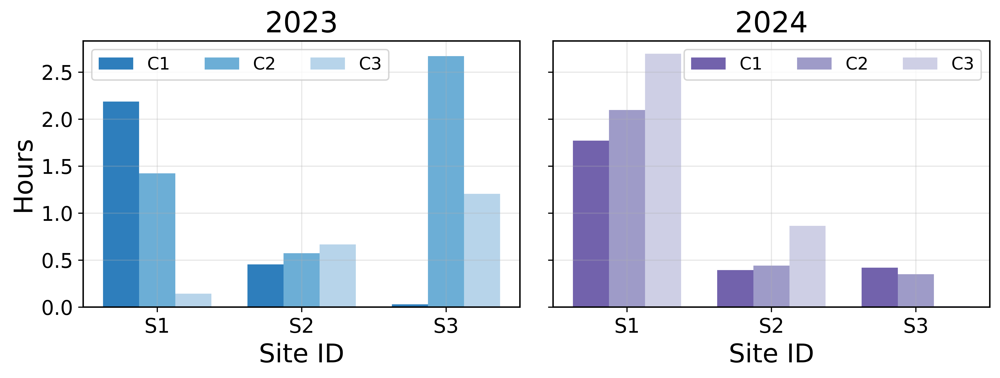

In [145]:
# Number of video per site per camera
pivot_df = videos_metadata_df.pivot_table(index=['site_id', 'site_cam_id'], columns='year', values='duration', aggfunc='sum', fill_value=0)
pivot_df = pivot_df / 3600
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

# Get unique sites and cameras
sites = pivot_df.index.get_level_values('site_id').unique()
cams = pivot_df.index.get_level_values('site_cam_id').unique()

# Plot for 2023
x1 = np.arange(len(sites))
width = 0.25
for i, cam in enumerate(cams):
    pos = x1 + (i-1)*width
    cam_data = pivot_df.xs(cam, level='site_cam_id')["2023"]
    ax1.bar(pos, cam_data, width, label=f'{cam}', color=color_dict.get((2023, cam)))

ax1.set_xlabel('Site ID')
ax1.set_ylabel('Hours')
ax1.set_title('2023')
ax1.set_xticks(x1)
ax1.set_xticklabels(sites)
ax1.legend(loc='upper left', ncols=len(cams))

# Plot for 2024
x2 = np.arange(len(sites))
for i, cam in enumerate(cams):
    pos = x2 + (i-1)*width
    cam_data = pivot_df.xs(cam, level='site_cam_id')["2024"]
    ax2.bar(pos, cam_data, width, label=f'{cam}', color=color_dict.get((2024, cam)))

ax2.set_xlabel('Site ID')
ax2.set_title('2024')
ax2.set_xticks(x2)
ax2.set_xticklabels(sites)
ax2.legend(loc='upper right', ncols=len(cams))
# dpi=500
plt.savefig("video_hours_by_camera_and_site.svg")
plt.tight_layout()
plt.show()

/tmp/ipykernel_1127922/3873738554.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_2023_df["elapsed_days"] = (
/tmp/ipykernel_1127922/3873738554.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year_2024_df["elapsed_days"] = (


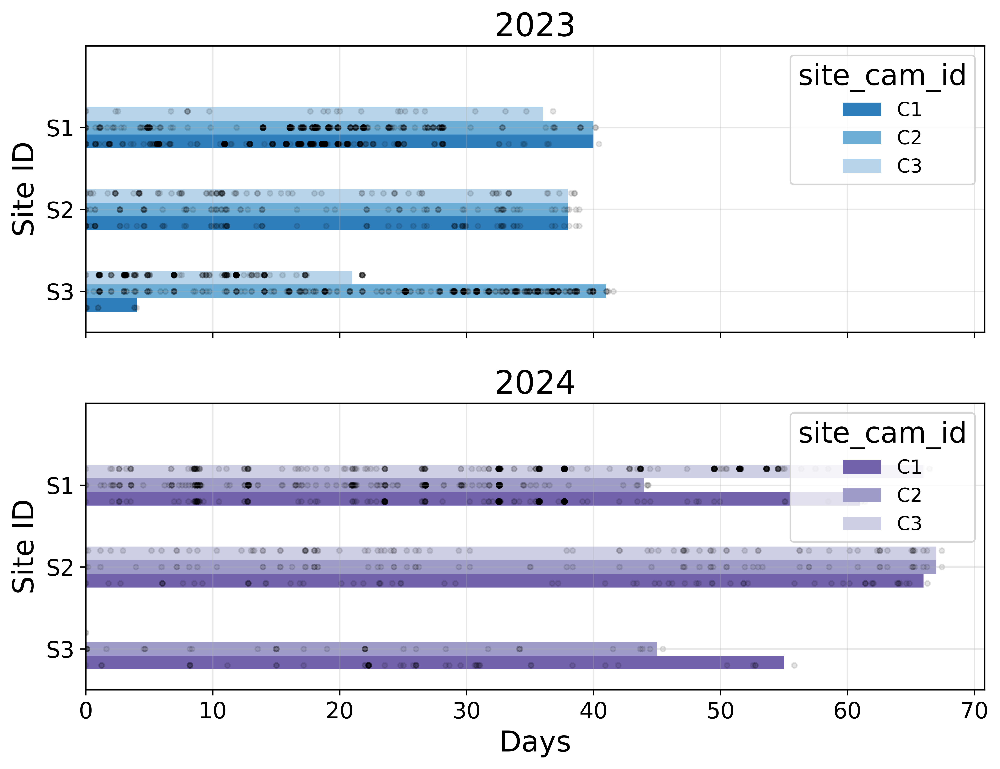

In [146]:
# Acquisition periods per camera per site, split by year

# Create figure with two subplots (one for each year)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(9, 7), sharex=True)

# For 2023 data
year_2023_df = videos_metadata_df[videos_metadata_df['year'] == "2023"]
# Compute acquisition start and end for 2023
end_acq_2023 = year_2023_df.groupby(["site_id", "site_cam_id"])[["date_time"]].max()
start_acq_2023 = year_2023_df.groupby(["site_id", "site_cam_id"])[["date_time"]].min()
acq_time_2023 = (end_acq_2023 - start_acq_2023)
acq_time_2023["elapsed_days"] = acq_time_2023["date_time"].apply(lambda d: d.days)

# Create barh plot for 2023
bar_data_2023 = acq_time_2023['elapsed_days'].unstack().sort_index(ascending=False)
bar_data_2023.plot(kind='barh', ax=ax1, legend=True, color=[blues[0], blues[1], blues[2]])

# Add scatter points for 2023
year_2023_df["elapsed_days"] = (
    year_2023_df.groupby(["site_id", "site_cam_id"])["date_time"]
    .transform(lambda x: (x - x.min()).dt.total_seconds() / 86400)
)

site_ids_2023 = bar_data_2023.index.tolist()
cam_ids_2023 = bar_data_2023.columns.tolist()
site_id_to_y_2023 = {site_id: i for i, site_id in enumerate(site_ids_2023)}

for j, cam_id in enumerate(cam_ids_2023):
    cam_df = year_2023_df[year_2023_df["site_cam_id"] == cam_id]
    for site_id in site_ids_2023:
        points = cam_df[cam_df["site_id"] == site_id]
        if not points.empty:
            y_pos = site_id_to_y_2023[site_id] + (j - 1) * 0.2
            # Changed scatter point color to black
            ax1.scatter(points["elapsed_days"], [y_pos] * len(points), alpha=0.1, s=10, color='black')

# For 2024 data
year_2024_df = videos_metadata_df[videos_metadata_df['year'] == "2024"]
# Compute acquisition start and end for 2024
end_acq_2024 = year_2024_df.groupby(["site_id", "site_cam_id"])[["date_time"]].max()
start_acq_2024 = year_2024_df.groupby(["site_id", "site_cam_id"])[["date_time"]].min()
acq_time_2024 = (end_acq_2024 - start_acq_2024)
acq_time_2024["elapsed_days"] = acq_time_2024["date_time"].apply(lambda d: d.days)

# Create barh plot for 2024
bar_data_2024 = acq_time_2024['elapsed_days'].unstack().sort_index(ascending=False)
bar_data_2024.plot(kind='barh', ax=ax2, legend=True, color=[purples[0], purples[1], purples[2]])

# Add scatter points for 2024
year_2024_df["elapsed_days"] = (
    year_2024_df.groupby(["site_id", "site_cam_id"])["date_time"]
    .transform(lambda x: (x - x.min()).dt.total_seconds() / 86400)
)

site_ids_2024 = bar_data_2024.index.tolist()
cam_ids_2024 = bar_data_2024.columns.tolist()
site_id_to_y_2024 = {site_id: i for i, site_id in enumerate(site_ids_2024)}

for j, cam_id in enumerate(cam_ids_2024):
    cam_df = year_2024_df[year_2024_df["site_cam_id"] == cam_id]
    for site_id in site_ids_2024:
        points = cam_df[cam_df["site_id"] == site_id]
        if not points.empty:
            y_pos = site_id_to_y_2024[site_id] + (j - 1) * 0.2
            # Changed scatter point color to black
            ax2.scatter(points["elapsed_days"], [y_pos] * len(points), alpha=0.1, s=10, color='black')

# Styling
ax1.set_ylabel("Site ID")
ax1.set_title("2023")
ax2.set_ylabel("Site ID") 
ax2.set_xlabel("Days")
ax2.set_title("2024")

# Set y-axis limits
ax1.set_ylim(top=len(site_ids_2023))
ax2.set_ylim(top=len(site_ids_2024))

plt.tight_layout()
plt.savefig("acquisition_periods.svg")
plt.show()

In [6]:
md_parser = MDVideoOutputParser()

annotated_dict = md_parser.parse_folder(Path("/media/EVO870/datasets/prompting-mammalps-v2/annotations/test"))
annotated_test_df = md_parser.to_dataframe(file_id_pattern=r"S\d_C\d_[EF]\d+_V\d{4}")

annotated_dict = md_parser.parse_folder(Path("/media/EVO870/datasets/prompting-mammalps-v2/annotations/train"))
annotated_train_df = md_parser.to_dataframe(file_id_pattern=r"S\d_C\d_[EF]\d+_V\d{4}")

annotated_df = pd.concat([annotated_test_df, annotated_train_df], axis=0, ignore_index=True).reset_index()
annotated_df = annotated_df.merge(videos_metadata_df, left_on="file_id", right_on="file_id")



100%|██████████| 2090/2090 [00:10<00:00, 204.13it/s]


In [151]:
annotated_df.sample(2)

,index,frame_id,detections,width,height,attributes.Weather,file_id,detection_file_path,track_id,bbox,...,video_file_path,annotation_file_path,duration,fps,sampling_weight,cam_id,site_id,year,site_cam_id,date_time
608687,608687,184,"{'track_id': 1, 'bbox': [758, 290, 881, 436], ...",1920.0,1080.0,clear,S2_C2_E376_V0119,S2/C2/S2_C2_E376_V0119.json,1.0,"[758, 290, 881, 436]",...,test/S2/C2/S2_C2_E376_V0119.mp4,test/S2/C2/S2_C2_E376_V0119.json,18.667,30.0,1.0,C2,S2,2023,C2,2023-09-28 20:39:52
537177,537177,247,"{'track_id': 2, 'bbox': [1360, 500, 1525, 656]...",NaN,NaN,sunny,S2_C3_F567_V0116,S2/C3/S2_C3_F567_V0116.json,2.0,"[1360, 500, 1525, 656]",...,test/S2/C3/S2_C3_F567_V0116.mp4,test/S2/C3/S2_C3_F567_V0116.json,119.333,30.0,1.0,C3,S2,2024,C3,2024-08-04 08:19:20


In [33]:
def get_attribute_df(annotated_tracklets_df: pd.DataFrame, col_name: str):
    if isinstance(col_name, list):
        df = pd.concat([
            annotated_tracklets_df
            .groupby(col)
            .agg({"file_id": pd.Series.nunique, "year": "min"})
            for col in col_name], axis=0)
        attributes_df = df.groupby(level=0).agg({"file_id": "sum", "year": "min"}).sort_values("file_id", ascending=False)
    else:
        attributes_df = (
            annotated_tracklets_df
            .groupby(col_name)
            .agg({"file_id": pd.Series.nunique, "year": "min"})
            .sort_values("file_id", ascending=False)
        )

    attributes_df["perc"] = attributes_df["file_id"] * 100 / attributes_df["file_id"].sum()

    return attributes_df

def plot_multi_season_frequencies(total_df: pd.DataFrame, col_name, log=False):

    df_2023 = total_df[total_df["year"] == "2023"]
    df_2024 = total_df[total_df["year"] == "2024"]

    total_df = pd.concat([get_attribute_df(df_2023, col_name), get_attribute_df(df_2024, col_name)], axis=0)
    if isinstance(col_name, list):
        total_df = total_df.reset_index(names=col_name[0]).groupby([col_name[0], "year"]).sum().unstack().fillna(0)
    else:
        total_df = total_df.reset_index().groupby([col_name, "year"]).sum().unstack().fillna(0)
    total_df["total"] = total_df[("file_id", "2023")] + total_df[("file_id", "2024")]
    total_df = total_df.sort_values("total", ascending=False)
    total_df["perc"] = total_df["total"] * 100 / total_df["total"].sum()

    fig, ax = plt.subplots(1,1, figsize=(14,6))
    colors = [blues[1], purples[1]]
    custom_cmap = ListedColormap(colors)

    total_df[["file_id"]].plot(kind="bar", width=0.8, edgecolor="k", ax=ax, stacked=True, cmap=custom_cmap, logy=log)

    ax.set_xticklabels(total_df.index.to_list(), rotation=30, ha="right")
    plt.grid(axis="y")
        
    # Add percentage text on each bar
    for i, (idx, row) in enumerate(total_df[["total", "perc"]].iterrows()):
        bar = ax.patches[i]
        height = row["total"].values[0] + 2
        perc = "<1" if row["perc"].values[0] < 1.0 else f'{row["perc"].values[0]:.1f}'
        color = "red" if row["total"].values[0] <= 5 else "black"
        ax.text(
            bar.get_x() + bar.get_width()/2, 
            height, 
            f'{row["total"].values[0]:.0f}\n({perc})%', 
            ha='center', 
            va='bottom', 
            fontsize=11, 
            color=color
        )

    ax.set_ylim(0.9, total_df["total"].max() + 40)
    plt.legend(["2023", "2024"])
    plt.tight_layout()
    plt.savefig(f"{col_name}"+"_comparaison.svg")
    plt.show()

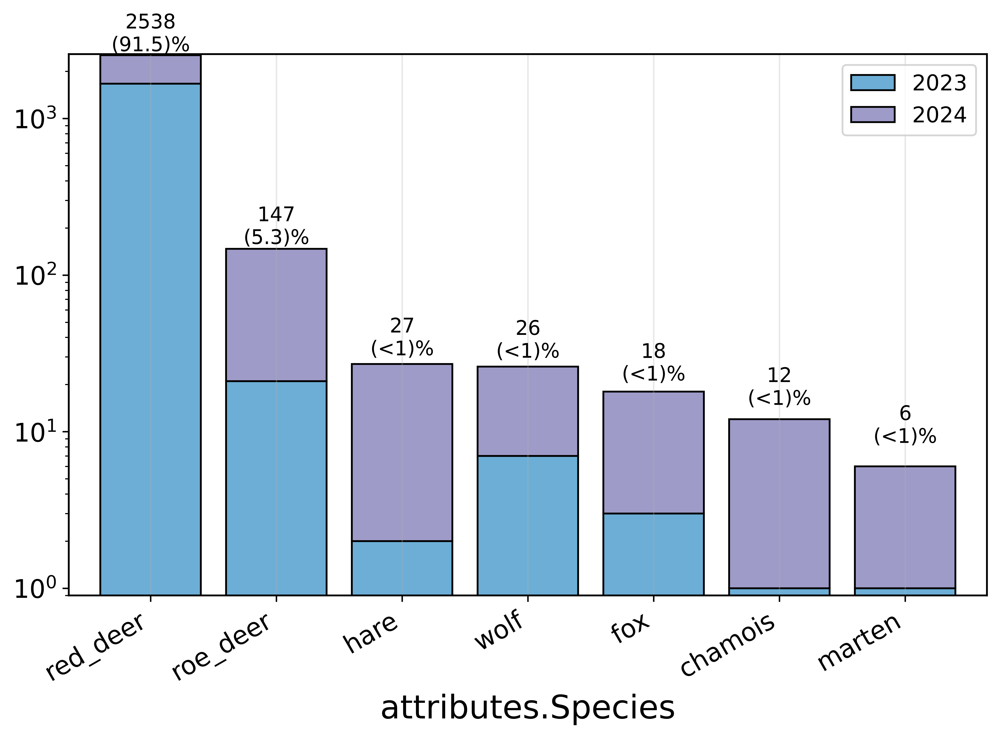

In [32]:
# Videos per Species 2023 vs 2024
plot_multi_season_frequencies(annotated_df, "attributes.Species", log=True)


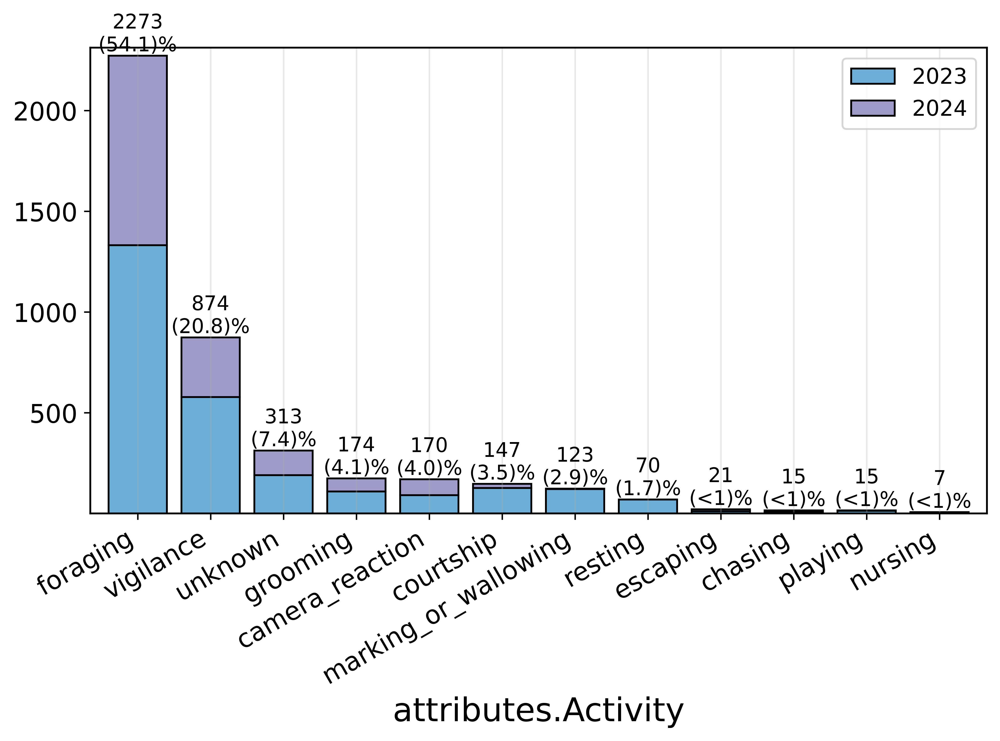

In [149]:
plot_multi_season_frequencies(annotated_df, "attributes.Activity")


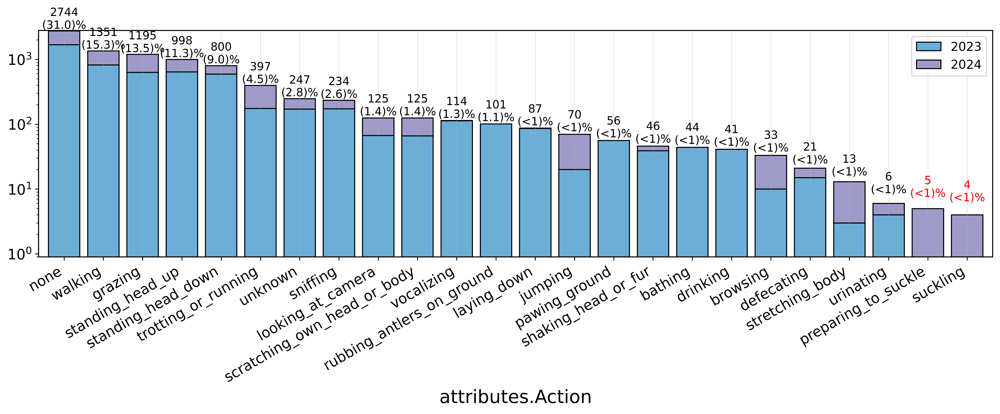

In [35]:
plot_multi_season_frequencies(annotated_df, ["attributes.Action", "attributes.Action2"], log=True)

In [13]:
def plot_split_frequencies(df: pd.DataFrame, col_name: str, log=False):

    fig, ax = plt.subplots(1,1, figsize=(12,8))

    # First get total number of events
    if isinstance(col_name, list):
        attributes_df = pd.concat([
            df
            .groupby([col, "split"], as_index=True)
            .agg({"file_id": pd.Series.nunique})
            for col in col_name], axis=0)
        attributes_df = attributes_df.reset_index(names=["attributes", "split"]).groupby(["attributes", "split"]).sum().sort_values("file_id", ascending=False)
    else:
        attributes_df = (
            df
            .groupby([col_name, "split"])
            .agg({"file_id": pd.Series.nunique})
            .sort_values("file_id", ascending=False)
        )
    
    attributes_df = attributes_df.rename(columns={"file_id": "nb_files"})
    total_df = attributes_df.unstack().fillna(0)
    total_df["total"] = total_df[("nb_files", "train")] + total_df[("nb_files", "test")]
    total_df = total_df.sort_values("total", ascending=False)
    total_df["train_split_perc"] = total_df[("nb_files", "train")] * 100 / total_df["total"]
    total_df = total_df.sort_index(level=1, axis=1, ascending=False)

    #cmap_full = plt.get_cmap("OrRd")
    #colors = [cmap_full(i) for i in np.linspace(0.25, 0.8, 2)]
    colors = ["xkcd:steel blue", "xkcd:light yellow"]
    custom_cmap = ListedColormap(colors)

    total_df[["nb_files"]].plot(kind="bar", width=0.8, edgecolor="k", ax=ax, stacked=True, cmap=custom_cmap, logy=log, alpha=0.5)
    
    ax.set_xticklabels(total_df.index.to_list(), rotation=30, ha="right")
    #plt.grid(axis="y")
        
    # Add percentage text on each bar
    for i, (idx, row) in enumerate(total_df[["total", "train_split_perc"]].iterrows()):
        bar = ax.patches[i]
        height = row["total"].values[0] + 2
        perc = f'{row["train_split_perc"].values[0]:.1f}'
        color = "black"
        ax.text(
            bar.get_x() + bar.get_width()/2, 
            height, 
            f'{perc}%', 
            ha='center', 
            va='bottom', 
            fontsize=9, 
            color="xkcd:steel blue"
        )

    ax.set_ylim(0.9, total_df["total"].max() + 40)
    plt.legend(["train", "test"])
    plt.tight_layout()
    fig.savefig(str(col_name)+"_splits.svg", transparent=True)
    plt.show()

In [14]:
annotated_df["split"] = annotated_df["video_file_path"].apply(lambda d: "test" if "test" in d else "train")

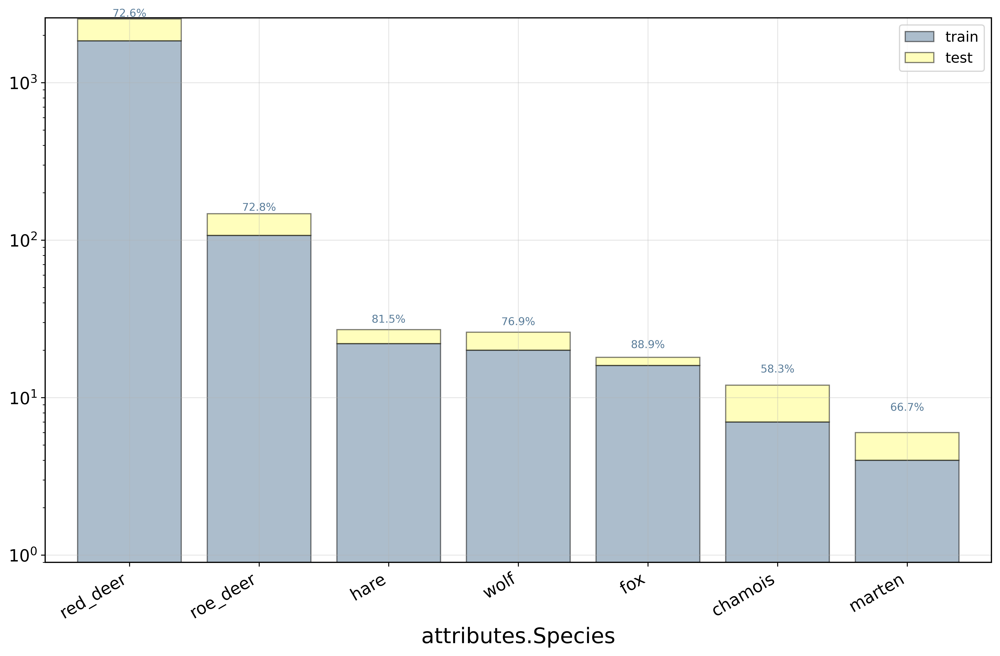

In [22]:
plot_split_frequencies(annotated_df, "attributes.Species", log=True)

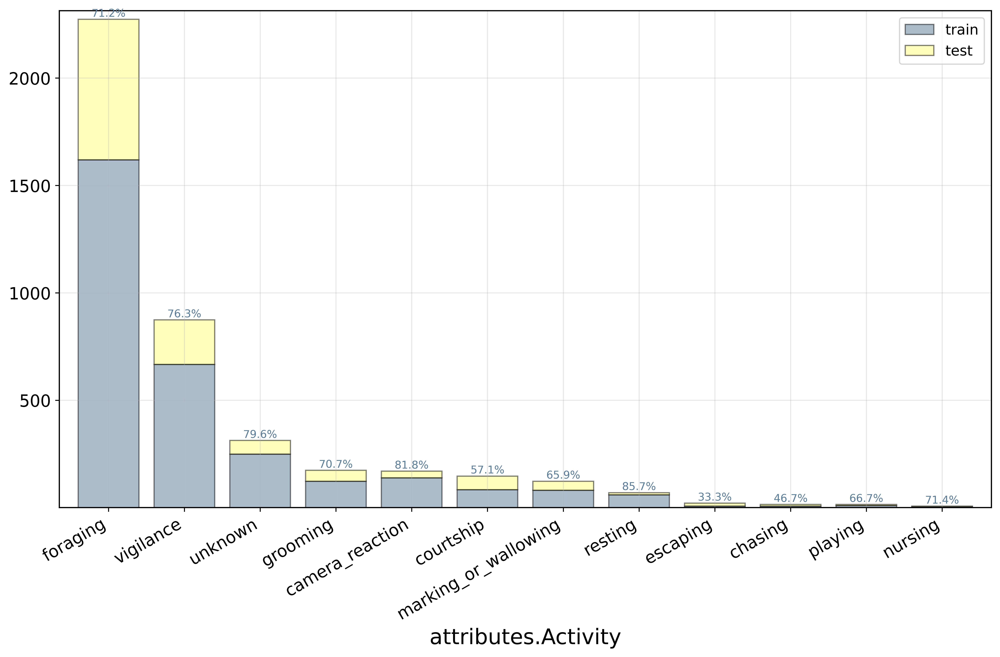

In [23]:
plot_split_frequencies(annotated_df, "attributes.Activity")

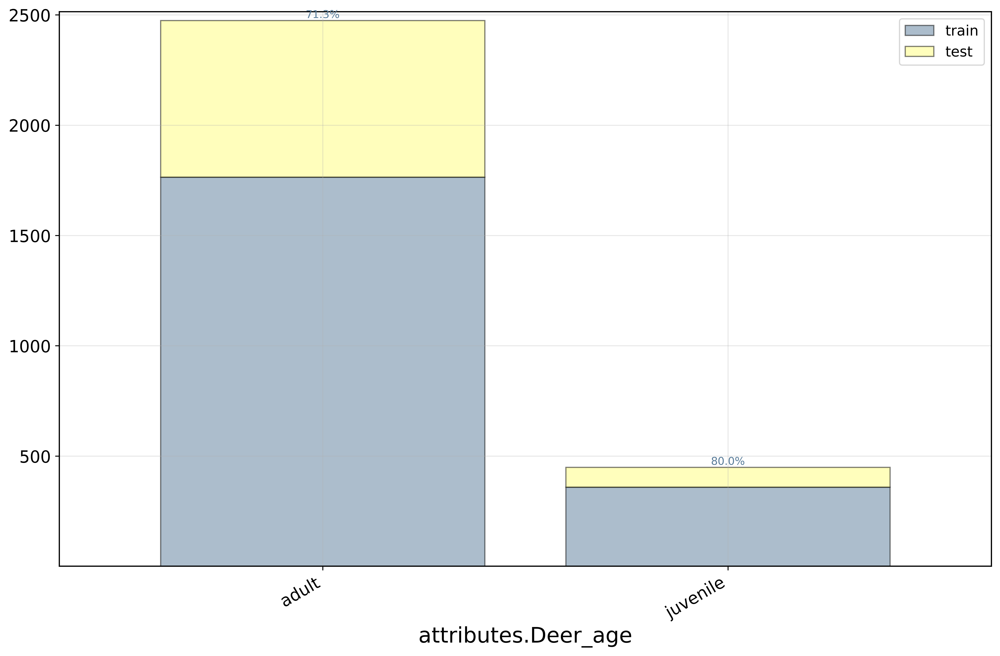

In [24]:
plot_split_frequencies(annotated_df, "attributes.Deer_age")

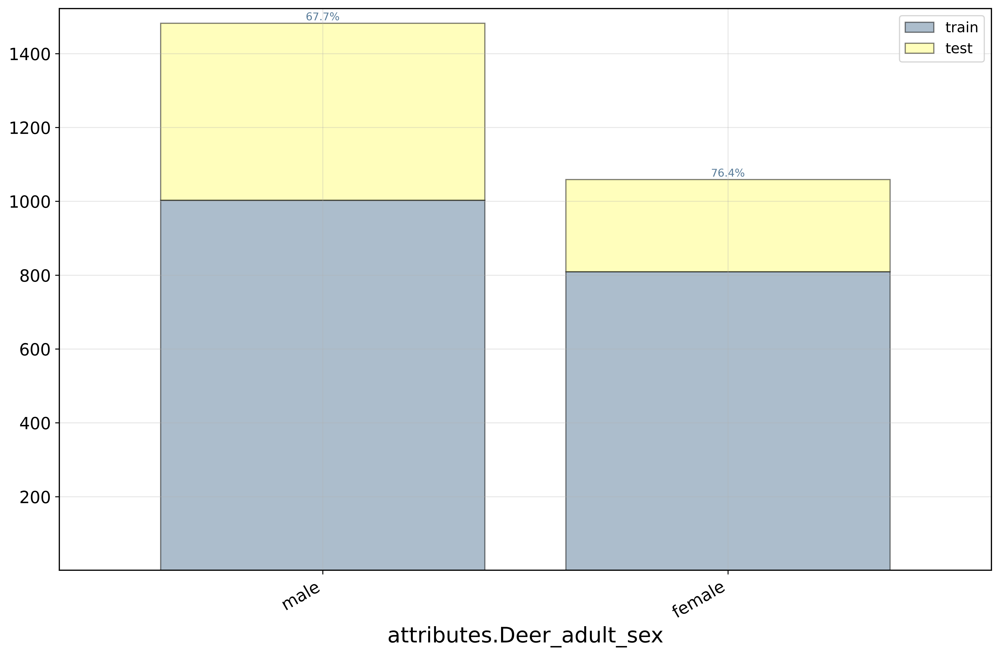

In [25]:
plot_split_frequencies(annotated_df, "attributes.Deer_adult_sex")

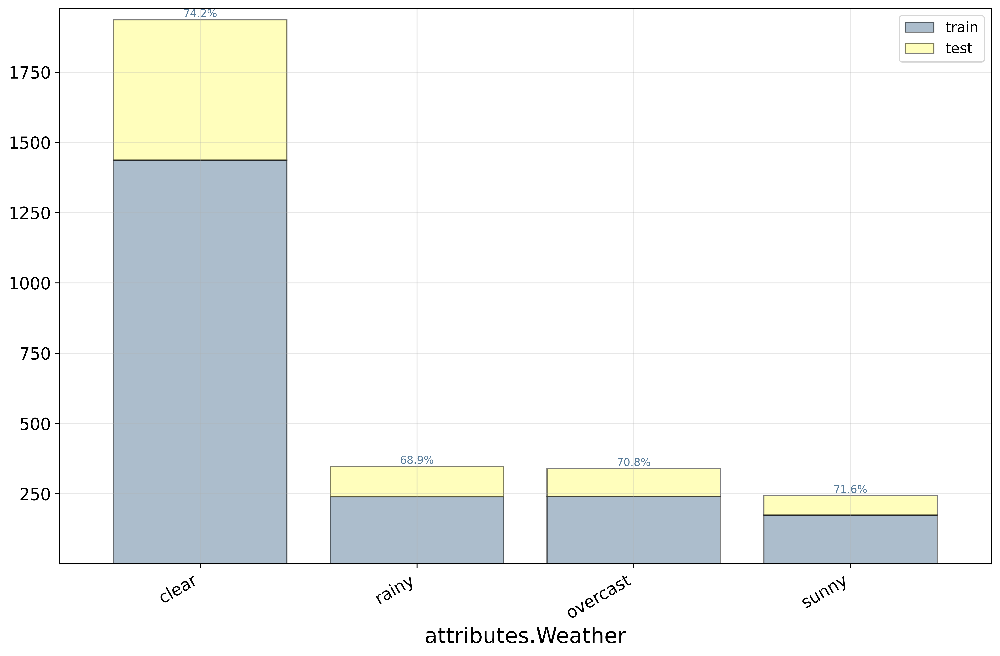

In [26]:
plot_split_frequencies(annotated_df, "attributes.Weather")

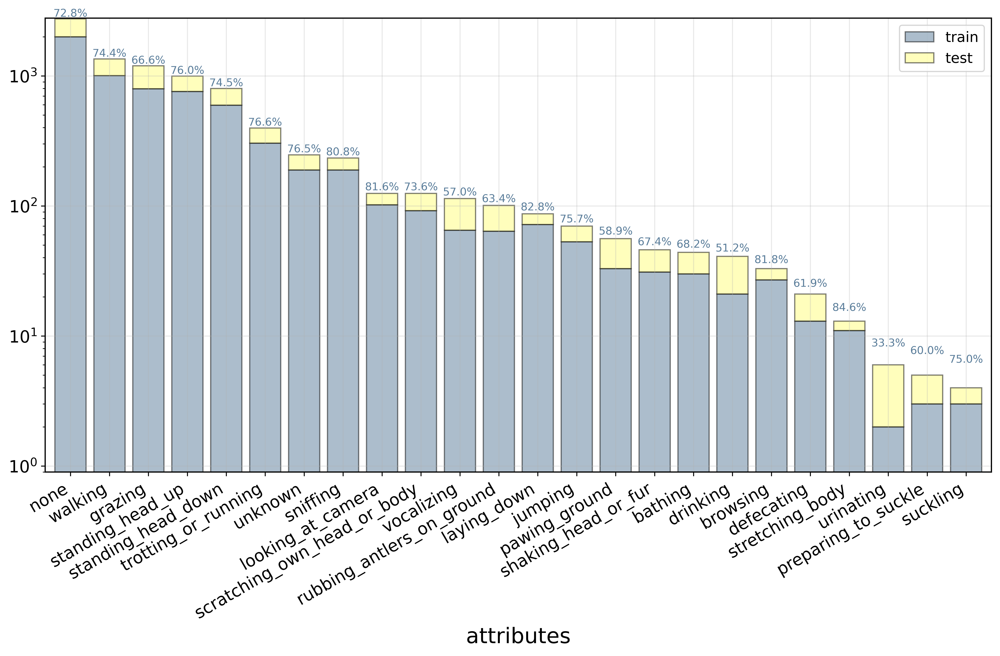

In [27]:
plot_split_frequencies(annotated_df, ["attributes.Action", "attributes.Action2"], log=True)